In [16]:
import json
import pandas as pd

In [3]:
path = '../output/data/replay_buffer_ca1_1665454862_0.json'
with open(path, 'r') as f:
    jsonstr = f.read()
    datas = json.loads(jsonstr)

In [4]:
datas

[['RNBAKABNR/9/1C5C1/P1P1P1P1P/9/9/p1p1p1p1p/1c5c1/9/rnbakabnr',
  [0.0,
   0.0,
   0.0,
   0.0,
   0.0,
   0.0,
   0.0,
   0.0,
   0.08163265306122448,
   0.02040816326530612,
   0.0,
   0.0,
   0.0,
   0.0,
   0.0,
   0.0,
   0.0,
   0.0,
   0.0,
   0.0,
   0.0,
   0.0,
   0.0,
   0.0,
   0.0,
   0.0,
   0.0,
   0.0,
   0.0,
   0.0,
   0.0,
   0.0,
   0.0,
   0.0,
   0.0,
   0.0,
   0.0,
   0.0,
   0.0,
   0.0,
   0.0,
   0.0,
   0.0,
   0.0,
   0.0,
   0.0,
   0.0,
   0.0,
   0.0,
   0.0,
   0.0,
   0.0,
   0.0,
   0.0,
   0.0,
   0.0,
   0.0,
   0.0,
   0.0,
   0.0,
   0.0,
   0.0,
   0.0,
   0.0,
   0.0,
   0.0,
   0.0,
   0.0,
   0.0,
   0.0,
   0.0,
   0.0,
   0.0,
   0.0,
   0.0,
   0.0,
   0.0,
   0.0,
   0.0,
   0.0,
   0.0,
   0.0,
   0.0,
   0.0,
   0.0,
   0.0,
   0.0,
   0.0,
   0.0,
   0.0,
   0.0,
   0.0,
   0.0,
   0.0,
   0.0,
   0.0,
   0.0,
   0.0,
   0.0,
   0.0,
   0.0,
   0.0,
   0.0,
   0.0,
   0.0,
   0.0,
   0.0,
   0.0,
   0.0,
   0.0,
   0.0,
   0.0,
   0.0,

In [8]:
INDEXS_2_PIECES = 'KARBNPCkarbnpc'

In [9]:
def check_capture(state_from, state_to):
    """检测从state_from到state_to被吃掉哪些棋子，如果没出现吃棋，则返回空数组"""
    state_from_dict = dict()
    for c in INDEXS_2_PIECES:
        state_from_dict[c] = 0

    state_to_dict = state_from_dict.copy()

    for c in state_from:
        if c in state_from_dict:
            state_from_dict[c] += 1

    for c in state_to:
        if c in state_to_dict:
            state_to_dict[c] += 1
    
    capture_list = []
    for key, count in state_from_dict.items():
        if count > state_to_dict[key]:
            capture_list.append(key)

    return capture_list

In [10]:
len(datas)

1009

In [14]:
capture_steps = list()
for index, item in enumerate(datas):
    if index + 1 < len(datas):
        next_item = datas[index + 1]
        captures = check_capture(item[0], next_item[0])
        capture_steps.append(captures)
capture_steps.append('end')

In [15]:
len(capture_steps)

1009

In [17]:
rewards = [x[2] for x in datas]

In [18]:
step_data = pd.DataFrame({'reward': rewards, 'captures': capture_steps})

In [20]:
step_data.sample(5)

,reward,captures
863,-5.043863e-09,[N]
896,-2.541000e+01,[C]
759,-6.127208e-01,[K]
46,0.000000e+00,[]
344,0.000000e+00,[]


In [21]:
import matplotlib.pyplot as plt

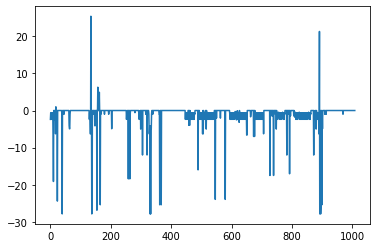

In [22]:
plt.plot(range(len(rewards)), rewards)

In [23]:
[2, 3, 4, 2].sum()

AttributeError: 'list' object has no attribute 'sum'